# Import

In [1]:
from rdkit import Chem
from rdkit import DataStructs
from rdkit.Chem import Draw, Lipinski
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import rdDepictor, rdMolDescriptors, rdFMCS, AllChem
from rdkit.Chem.MolStandardize import rdMolStandardize

from tqdm import tqdm
from rdkit.ML.Cluster.Butina import ClusterData
from rdkit.DataManip.Metric import GetTanimotoDistMat
from rdkit.SimDivFilters.rdSimDivPickers import HierarchicalClusterPicker, ClusterMethod


from IPython.core.display import display, HTML, Math

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import mols2grid

import time
rdDepictor.SetPreferCoordGen(True)

import rdkit
%pylab inline
print(rdkit.__version__)

cmap = plt.get_cmap("tab10")


INFO:rdkit:Enabling RDKit 2020.09.1 jupyter extensions


Populating the interactive namespace from numpy and matplotlib
2020.09.1


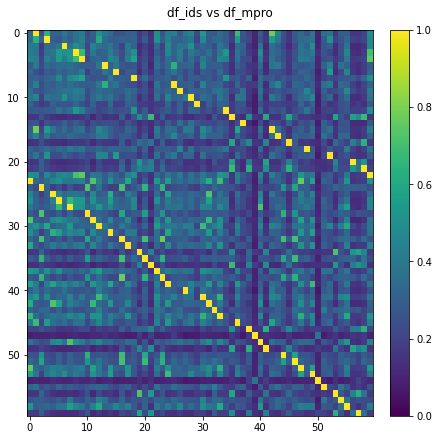

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [11]:
df_ids = pd.read_csv('/home/wjm41/ml_physics/frag-pcore-screen/data/mpro_mols.csv')

df_mpro = pd.read_csv(
    '/home/wjm41/ml_physics/frag-pcore-screen/data/EnamineREAL/topN/mpro_taut_picks_constrained.csv')

df_ids['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
        Chem.MolFromSmiles(smi), 2, 2048, useFeatures=True) for smi in df_ids["smiles"]]  # pharmacophore fingerprint
df_mpro['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
        Chem.MolFromSmiles(smi), 2, 2048, useFeatures=True) for smi in df_mpro["smiles"]]  # pharmacophore fingerprint

sim_mat = np.empty((len(df_ids), len(df_mpro)))
for i in range(len(df_ids)):
    sim_mat[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(df_ids['fps'].values[i], df_mpro['fps'].values))

fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
fig.suptitle('df_ids vs df_mpro')
cax = ax.matshow(sim_mat, aspect="auto", vmin=0, vmax=1)
ax.xaxis.set_ticks_position('bottom')
fig.colorbar(cax)
plt.show()

for row in sim_mat:
        print(np.amax(row))


In [3]:
dist_thresh = 0.2  # elements within this range of each other are considered to be neighbors ; max distance = 0.6?

df_ids = pd.read_csv('/home/wjm41/ml_physics/frag-pcore-screen/data/mpro_mols.csv')

df_mpro = pd.read_csv(
    '/home/wjm41/ml_physics/frag-pcore-screen/data/EnamineREAL/topN/mpro_taut_picks_constrained.csv')
df_mac = pd.read_csv(
    '/home/wjm41/ml_physics/frag-pcore-screen/data/EnamineREAL/topN/mac1_taut_picks_constrained.csv')

df_mpro['mol'] = df_mpro['smiles'].apply(Chem.MolFromSmiles)
mpro_grid = mols2grid.display(df_mpro, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img", "membership", 'smiles'], transform={"membership": lambda x: f"Cluster #: {x}"},
                  tooltip=['smiles'],
                  maxMols=60, size=(300, 150), selection=True)
display(HTML('<b>Mpro Butina</b>'))
display(mpro_grid)

# df_mac['mol'] = df_mac['smiles'].apply(Chem.MolFromSmiles)
# mac1_grid = mols2grid.display(df_mac, template="pages", smiles_col='smiles', mol_col='mol',
#                               n_rows=15, n_cols=4, subset=["img", "membership", 'smiles'], transform={"membership": lambda x: f"Cluster #: {x}"},
#                               tooltip=['smiles'],
#                               maxMols=60, size=(300, 150), selection=True)
# display(HTML('<b>Mac-1 Butina</b>'))
# display(mac1_grid)

### Substructure alerts

In [2]:
furan = Chem.MolFromSmarts('[o]1[c][c][c][c]1')
thiophene = Chem.MolFromSmarts('[s]1[c][c][c][c]1')
thiol = Chem.MolFromSmarts('[S][#1]')
phenol = Chem.MolFromSmarts('[c]1[c][c][c][c][c]1[O][#1]')
nitro = Chem.MolFromSmarts('[c][$([NX3](=O)=O),$([NX3+](=O)[O-])]')

boronic_acid = Chem.MolFromSmarts('B') # just remove boron-containing compounds
sulphonic_acid = Chem.MolFromSmarts('S(-O)-O')  # TODO proper smarts

alert_substructs = \
    [furan,
     thiophene,
     thiol,
     phenol,
     nitro,
     boronic_acid,
     sulphonic_acid
    ]

def search_alerts(mol, alert_substructs=alert_substructs):
    for substruct in alert_substructs:
        if Chem.AddHs(mol).HasSubstructMatch(substruct):
            return True
    else:
        return False

def lipinski(mol, n=8):
    if Lipinski.NumHDonors(mol) + Lipinski.NumHAcceptors(mol) > n:
        return True
    else:
        return False
        
data_dir = '/rds-d7/project/rds-ZNFRY9wKoeE/EnamineREAL/data/'

enumerator = rdMolStandardize.TautomerEnumerator()
# enumerator.SetMaxTautomers(100)

In [3]:
!ls

butina_selection.py	  numpy				  score_topN.ipynb
compound_selection.ipynb  pharmacophore_histograms.ipynb  subm_datacheck
data_checking.ipynb	  pharmacophore_pvalues.ipynb	  subm_dmat_calc
data_checking.py	  pickles			  subm_kde
dirs			  read_frags_dpp11.ipynb	  subm_selection
fast_zinc_test.ipynb	  read_frags_mac.ipynb		  visualise_picks.ipynb
filter.ipynb		  read_frags_mpro.ipynb		  zinc_df.pkl
frag_funcs.py		  Reading_PDBs.ipynb		  zinc_ef.ipynb
gen_kde.py		  remove_output.py		  zinc_pairs.pkl
nbody.ipynb		  score_histogram.ipynb


In [16]:
df_old = pd.read_csv(data_dir+'../topN/topN_new_filtered_mpro.csv',
                     index_col=False, usecols=['smiles', 'pains', 'diastereomer', 'keep'])
df_new = pd.read_csv(data_dir+'../topN/topN_nonan_filtered_mpro.csv',
                     usecols=['smiles', 'pains', 'diastereomer', 'keep'])

df_old = df_old[['smiles', 'pains', 'diastereomer', 'keep']]
df_new = df_new[['smiles', 'pains', 'diastereomer', 'keep']]

True


In [5]:
# target = 'mac1'
lipinski_n = 8

df_mpro = pd.read_csv(data_dir+'../topN/topN_new_filtered_mpro.csv')
print('No. of mols before alert filtering: {}'.format(len(df_mpro)))
df_mpro['mol'] = [Chem.MolFromSmiles(smi) for smi in df_mpro["smiles"]]
df_mpro["alerts"] = df_mpro['mol'].apply(search_alerts)

# # Tests
# print(search_alerts(
#     (Chem.MolFromSmiles('Cn1c(=O)[nH]c(=O)c2cc(S(O)(O)Oc3ccccc3F)cnc21'))))
# print(search_alerts(
#     (Chem.MolFromSmiles('O=C(NNc1c(F)cccc1F)c1cc(B(O)O)ccc1F'))))

df_mpro = df_mpro[~df_mpro["alerts"]].reset_index()

print('No. of mols after alert filtering: {}'.format(len(df_mpro)))


df_mpro["lipinski"] = df_mpro['mol'].apply(lipinski, n=lipinski_n)
df_mpro = df_mpro[~df_mpro["lipinski"]].reset_index()
print('No. of mols after lipinski filtering: {}'.format(len(df_mpro)))
# df_mpro['mol'] = [enumerator.Canonicalize(Chem.MolFromSmiles(smi)) for smi in tqdm(df_mpro["smiles"])]
df_mpro['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048, useFeatures=True) for m in df_mpro['mol']] # pharmacophore fingerprint
df_mpro.reset_index(drop=True, inplace=True)

# rand_fps = df_mpro['fps'].sample(n=60).values
# rand_mat = np.empty((len(rand_fps), len(rand_fps)))
# for i in range(len(rand_fps)):
#     rand_mat[i] = np.array(
#         DataStructs.BulkTanimotoSimilarity(rand_fps[i], rand_fps))

# mask = np.tri(rand_mat.shape[0], k=-1)  # masks the lower triangle
# rand_masked = np.ma.array(rand_mat, mask=mask)
df_mpro.iloc[:30]
d_mat_mpro = GetTanimotoDistMat(df_mpro['fps'].values)
# np.save('dmat_mpro_mean.npy', d_mat_mpro)


No. of mols before alert filtering: 30902
No. of mols after alert filtering: 25184
No. of mols after lipinski filtering: 7917


In [6]:
# np.save('numpy/dmat_constrained_mean_canon_mpro.npy', d_mat_mpro)

dist_thresh = 0.2  # elements within this range of each other are considered to be neighbors ; max distance = 0.6?

# d_mat_mpro = np.load('dmat_mpro_old.npy')
clusters_mpro = ClusterData(d_mat_mpro, nPts=len(
    df_mpro), isDistData=True, distThresh=dist_thresh, reordering=True)
print('Number of Mpro clusters: {} (from {} mols)'.format(
    len(clusters_mpro), len(df_mpro)))

cluster_id_list = [0]*len(df_mpro)
for idx, cluster in enumerate(clusters_mpro, 1):
    for member in cluster:
        cluster_id_list[member] = idx
df_mpro.reset_index(drop=True, inplace=True)
df_mpro['Cluster'] = [x-1 for x in cluster_id_list]
print(clusters_mpro)
# cluster_rows = []
# for k, v in df_mpro.groupby("Cluster"):
#     cluster_rows.append([v.smiles.values[0], v.mol.values[0], k, len(v)])
# butina_mpro_df = pd.DataFrame(
#     cluster_rows, columns=["smiles", 'mol', "Cluster", "Membership"])
# butina_mpro_df = butina_mpro_df.nlargest(n=60, columns='Membership')
butina_mpro_df = df_mpro.iloc[[clusters_mpro[n][0] for n in range(60)]]
butina_mpro_df['Membership'] = [len(clusters_mpro[n]) for n in range(60)]

display(
    Math(r'\textrm{Mpro Butina } (N_{donor} + N_{acceptor} < '+str(lipinski_n)+')'))
mols2grid.display(butina_mpro_df, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img", "Cluster"], transform={"Cluster": lambda x: f"Cluster: {x}"},
                  tooltip=['smiles', 'Membership'],
                  maxMols=60, size=(300, 150), selection=True)


Number of Mpro clusters: 4348 (from 7917 mols)
((3461, 17, 34, 54, 59, 85, 108, 137, 172, 180, 278, 303, 306, 332, 369, 413, 429, 433, 482, 551, 554, 680, 992, 1027, 1070, 1089, 1131, 1203, 1549, 1975, 2116, 2395, 2508, 2676, 2807, 2897, 3040, 3320, 3467, 3719, 3834, 3965, 4130, 4324, 5013, 5314, 5585, 5666, 5813, 5890, 6608, 6865, 6895, 6946, 7085, 7402, 7731, 7830), (7686, 702, 813, 1003, 1055, 1163, 1825, 2235, 2367, 2375, 2423, 2481, 2497, 2587, 2605, 2618, 2710, 2729, 2908, 3223, 3388, 3521, 3731, 3832, 4213, 4874, 5220, 5581, 6106, 6279, 6731, 6732, 7145), (3405, 0, 6, 158, 305, 308, 355, 385, 426, 510, 572, 585, 645, 712, 717, 852, 1100, 1151, 1171, 1606, 2105, 4109), (1315, 57, 100, 162, 196, 254, 255, 299, 350, 367, 391, 634, 691, 883, 895, 917, 1041, 1726, 1819, 2606, 2818, 2983), (1489, 237, 501, 522, 524, 761, 1133, 1521, 1652, 1777, 1796, 2826, 4407, 4582, 5110, 5359, 5874, 5887, 6509, 6952, 7128), (4819, 231, 556, 617, 713, 770, 990, 1005, 1355, 2041, 2325, 2486, 2652, 28

/rds-d2/user/wjm41/hpc-work/conda/envs/fresco/lib/python3.7/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Math object>

In [47]:
def cluster_members(df, sel, align_mcs=True):
    """A function to generate an image for the molecules from the selected cluster"""
    mol_list = []
    img = "Nothing selected"
    if len(sel):
        sel_df = df.query("Cluster in @sel")
        # sel_df = df.iloc[sel]
        mol_list = [Chem.MolFromSmiles(x) for x in sel_df.smiles]
        # strip counterions
        # Align structures on the MCS
        if align_mcs and len(mol_list) > 1:
            mcs = rdFMCS.FindMCS(mol_list)
            mcs_query = Chem.MolFromSmarts(mcs.smartsString)
            AllChem.Compute2DCoords(mcs_query)
            for m in mol_list:
                AllChem.GenerateDepictionMatching2DStructure(m, mcs_query)
        # legends = list(sel_df.smiles.astype(str))
        grid = mols2grid.display(mol_list, template="pages",
                  n_rows=15, n_cols=4, subset=["img"],
                  tooltip=['SMILES'],
                  maxMols=60, size=(300, 150), selection=False)
    return grid


display(cluster_members(df_mpro, [0], True))


In [34]:
!python butina_selection.py -target mpro -method mean
!python butina_selection.py -target mpro -method mean --useFeatures
!python butina_selection.py -target mac1 -method mean 
!python butina_selection.py -target mac1 -method mean --useFeatures

No. of mols before alert filtering: 50000
No. of mols after alert filtering: 41405
No. of mols after lipinski filtering: 14099
Index                    128
level_0               112792
index                 112792
Unnamed: 0            112792
smiles               1636595
Donor-Aromatic        112792
Donor-Acceptor        112792
Aromatic-Aromatic     112792
Donor-Donor           112792
Aromatic-Acceptor     112792
Acceptor-Acceptor     112792
mean_score            112792
keep                   14099
pains                  14099
diastereomer           14099
mol                  1466296
alerts                 14099
lipinski               14099
fps                  1466296
dtype: int64
100%|████████████████████████████████████| 14098/14098 [00:46<00:00, 303.88it/s]
Number of mpro clusters: 11712 (from 14099 mols)
butina_selection.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [3]:
df_mac1 = pd.read_csv(data_dir+'../topN/topN_mean_filtered_mac1.csv')
print('No. of mols before alert filtering: {}'.format(len(df_mac1)))
df_mac1['mol'] = [Chem.MolFromSmiles(smi) for smi in df_mac1["smiles"]]
df_mac1["alerts"] = df_mac1['mol'].apply(search_alerts)

# # Tests
# print(search_alerts(
#     (Chem.MolFromSmiles('Cn1c(=O)[nH]c(=O)c2cc(S(O)(O)Oc3ccccc3F)cnc21'))))
# print(search_alerts(
#     (Chem.MolFromSmiles('O=C(NNc1c(F)cccc1F)c1cc(B(O)O)ccc1F'))))

df_mac1 = df_mac1[~df_mac1["alerts"]].reset_index()
print('No. of mols after alert filtering: {}'.format(len(df_mac1)))

lipinski_n = 8  # upper limit on n_h_donors + n_h_acceptors

df_mac1["lipinski"] = df_mac1['mol'].apply(lipinski, n=lipinski_n)
df_mac1 = df_mac1[~df_mac1["lipinski"]].reset_index()
print('No. of mols after lipinski filtering: {}'.format(len(df_mac1)))
# df_mac1['mol'] = [enumerator.Canonicalize(
#     Chem.MolFromSmiles(smi)) for smi in tqdm(df_mac1["smiles"])]

df_mac1['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048, useFeatures=True) for m in df_mac1['mol']]  # pharmacophore fingerprint
df_mac1.reset_index(drop=True, inplace=True)

# d_mat = GetTanimotoDistMat(df_mac1['fps'].values)
# np.save('numpy/dmat_constrained_mean_canon_mac1.npy', d_mat)
d_mat = np.load('numpy/dmat_constrained_mean_mac1.npy')

dist_thresh = 0.2  # elements within this range of each other are considered to be neighbors ; max distance = 0.6?

# d_mat = np.load('dmat_mpro_old.npy')
clusters_mac1 = ClusterData(d_mat, nPts=len(
    df_mac1), isDistData=True, distThresh=dist_thresh, reordering=True)
print('Number of Mac1 clusters: {} (from {} mols)'.format(
    len(clusters_mac1), len(df_mac1)))

cluster_id_list = [0]*len(df_mac1)
for idx, cluster in enumerate(clusters_mac1, 1):
    for member in cluster:
        cluster_id_list[member] = idx
df_mac1.reset_index(drop=True, inplace=True)
df_mac1['Cluster'] = [x-1 for x in cluster_id_list]

# cluster_rows = []
# for k, v in df_mac1.groupby("Cluster"):
#     cluster_rows.append([v.smiles.values[0], v.mol.values[0], k, len(v)])
# butina_mac1_df = pd.DataFrame(l
#     cluster_rows, columns=["smiles", 'mol', "Cluster", "Membership"])
# butina_mac1_df = butina_mac1_df.nlargest(n=60, columns='Membership')
butina_mac1_df = df_mac1.iloc[[clusters_mac1[n][0] for n in range(60)]]
butina_mac1_df['Membership'] = [len(clusters_mac1[n]) for n in range(60)]

display(Math(r'\textrm{Mac1 Butina } (N_{donor} + N_{acceptor} < '+str(lipinski_n)+')'))
mols2grid.display(butina_mac1_df, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img", "Cluster"], transform={"Cluster": lambda x: f"Cluster: {x}"},
                  tooltip=['smiles', 'Membership'],
                  maxMols=60, size=(300, 150), selection=True)

No. of mols before alert filtering: 50000
No. of mols after alert filtering: 46725
No. of mols after lipinski filtering: 19601
Number of Mac1 clusters: 8424 (from 19601 mols)


/rds-d2/user/wjm41/hpc-work/conda/envs/fresco/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Math object>

In [4]:
def cluster_members(df, sel, align_mcs=True):
    """A function to generate an image for the molecules from the selected cluster"""
    mol_list = []
    img = "Nothing selected"
    if len(sel):
        sel_df = df.query("Cluster in @sel")
        # sel_df = df.iloc[sel]
        mol_list = [Chem.MolFromSmiles(x) for x in sel_df.smiles]
        # strip counterions
        # Align structures on the MCS
        if align_mcs and len(mol_list) > 1:
            mcs = rdFMCS.FindMCS(mol_list)
            mcs_query = Chem.MolFromSmarts(mcs.smartsString)
            AllChem.Compute2DCoords(mcs_query)
            for m in mol_list:
                AllChem.GenerateDepictionMatching2DStructure(m, mcs_query)
        # legends = list(sel_df.smiles.astype(str))
        grid = mols2grid.display(mol_list, template="pages",
                  n_rows=15, n_cols=4, subset=["img"],
                  tooltip=['SMILES'],
                  maxMols=60, size=(300, 150), selection=False)
    return grid


display(cluster_members(df_mac1, [3], True))

In [9]:
df_mac1 = pd.read_csv(data_dir+'../topN/topN_mean_filtered_mac1.csv')
print('No. of mols before alert filtering: {}'.format(len(df_mac1)))
df_mac1['mol'] = [Chem.MolFromSmiles(smi) for smi in df_mac1["smiles"]]
df_mac1["alerts"] = df_mac1['mol'].apply(search_alerts)

df_mac1 = df_mac1[~df_mac1["alerts"]].reset_index()
print('No. of mols after alert filtering: {}'.format(len(df_mac1)))

lipinski_n = 8  # upper limit on n_h_donors + n_h_acceptors

df_mac1["lipinski"] = df_mac1['mol'].apply(lipinski, n=lipinski_n)
df_mac1 = df_mac1[~df_mac1["lipinski"]].reset_index()
print('No. of mols after lipinski filtering: {}'.format(len(df_mac1)))
df_mac1['mol'] = [enumerator.Canonicalize(
    Chem.MolFromSmiles(smi)) for smi in tqdm(df_mac1["smiles"])]

df_mac1['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048, useFeatures=True) for m in df_mac1['mol']]  # pharmacophore fingerprint
df_mac1.reset_index(drop=True, inplace=True)

d_mat = GetTanimotoDistMat(df_mac1['fps'].values)
np.save('numpy/dmat_constrained_mean_canon_mac1.npy', d_mat)
# d_mat = np.load('numpy/dmat_constrained_mean_mac1.npy')

dist_thresh = 0.2  # elements within this range of each other are considered to be neighbors ; max distance = 0.6?

# d_mat = np.load('dmat_mpro_old.npy')
clusters_mac1 = ClusterData(d_mat, nPts=len(
    df_mac1), isDistData=True, distThresh=dist_thresh, reordering=True)
print('Number of Mac1 clusters: {} (from {} mols)'.format(
    len(clusters_mac1), len(df_mac1)))

cluster_id_list = [0]*len(df_mac1)
for idx, cluster in enumerate(clusters_mac1, 1):
    for member in cluster:
        cluster_id_list[member] = idx
df_mac1.reset_index(drop=True, inplace=True)
df_mac1['Cluster'] = [x-1 for x in cluster_id_list]

# cluster_rows = []
# for k, v in df_mac1.groupby("Cluster"):
#     cluster_rows.append([v.smiles.values[0], v.mol.values[0], k, len(v)])
# butina_mac1_df = pd.DataFrame(l
#     cluster_rows, columns=["smiles", 'mol', "Cluster", "Membership"])
# butina_mac1_df = butina_mac1_df.nlargest(n=60, columns='Membership')
butina_mac1_df = df_mac1.iloc[[clusters_mac1[n][0] for n in range(60)]]
butina_mac1_df['Membership'] = [len(clusters_mac1[n]) for n in range(60)]

display(Math(r'\textrm{Mac1 Butina } (N_{donor} + N_{acceptor} < '+str(lipinski_n)+') - Canonicalized Tautomers'))
mols2grid.display(butina_mac1_df, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img", "Cluster"], transform={"Cluster": lambda x: f"Cluster: {x}"},
                  tooltip=['smiles', 'Membership'],
                  maxMols=60, size=(300, 150), selection=True)

No. of mols before alert filtering: 50000


In [51]:
display(cluster_members(df_mac1, [45], True))

In [ ]:
df_mac1 = pd.read_csv(data_dir+'../topN/topN_new_filtered_mac1.csv')
print('No. of mols before alert filtering: {}'.format(len(df_mac1)))

df_mac1['mol'] = [Chem.MolFromSmiles(smi) for smi in df_mac1["smiles"]]
df_mac1["alerts"] = df_mac1['mol'].apply(search_alerts)
df_mac1 = df_mac1[~df_mac1["alerts"]].reset_index()
print('No. of mols after alert filtering: {}'.format(len(df_mac1)))
df_mac1['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048, useFeatures=True) for m in df_mac1['mol']]  # pharmacophore fingerprint
    
df_mac1.reset_index(drop=True, inplace=True)
d_mat_mac1 = GetTanimotoDistMat(df_mac1['fps'].values)
np.save('dmat_mac1_old.npy', d_mat_mac1)


Error: Session cannot generate requests

# Clustering

# More efficient GetTanimotoDistMat

In [21]:
small_dmat = GetTanimotoDistMat(df_mpro['fps'].values[:50])

fps = df_mpro['fps'].values[:50]
n = len(fps)
efficient_dmat = np.empty(int(n*(n-1)/2))

n = 0
for i in tqdm(range(1, len(fps))):
    print(i)
    print(len(fps[:i]))
    efficient_dmat[n:n+i] =  np.ones_like(fps[:i]) - \
        DataStructs.cDataStructs.BulkTanimotoSimilarity(fps[i], fps[:i])
    n += i

print(np.array_equal(small_dmat, efficient_dmat))


100%|██████████| 49/49 [00:00<00:00, 3196.98it/s]

1
1 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>]
2
2 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
3
3 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
4
4 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
5
5 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
6
6 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
7
7 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
8
8 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
9
9 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
10
10 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
11
11 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
12
12 [<rdkit.DataStructs.cDataStructs.ExplicitBitVect object at 0x2ad0cb940490>
13
13 [<rdkit.DataStructs.cDataStructs.Explic

In [26]:
data_dir = '/rds-d7/project/rds-ZNFRY9wKoeE/EnamineREAL/data/'

df_mac1 = pd.read_csv(data_dir+'../topN/topN_new_filtered_mac1.csv')
print('No. of mols before alert filtering: {}'.format(len(df_mac1)))

df_mac1['mol'] = [Chem.MolFromSmiles(smi) for smi in df_mac1["smiles"]]
# df_mac1["alerts"] = df_mac1['mol'].apply(search_alerts)
# df_mac1 = df_mac1[~df_mac1["alerts"]].reset_index()
# print('No. of mols after alert filtering: {}'.format(len(df_mac1)))
df_mac1['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048, useFeatures=True) for m in df_mac1['mol']]  # pharmacophore fingerprint

df_mac1.reset_index(drop=True, inplace=True)

fps = df_mac1['fps'].values
n = len(df_mac1)
n = len(fps)
d_mat_mac1 = np.empty(int(n*(n-1)/2))

n = 0
for i in tqdm(range(1, len(fps))):
    d_mat_mac1[n:n+i] = np.ones_like(fps[:i]) - \
        DataStructs.cDataStructs.BulkTanimotoSimilarity(fps[i], fps[:i])
    n += i

# d_mat_mac1 = GetTanimotoDistMat(df_mac1['fps'].values)
np.save('dmat_mac1_old.npy', d_mat_mac1)


No. of mols before alert filtering: 50000


100%|██████████| 49999/49999 [05:54<00:00, 141.02it/s]


Investigate distThresh parameter

In [ ]:
d_mat_mpro = GetTanimotoDistMat(df_mpro['fps'].values[:50])

clusters_mpro = ClusterData(d_mat_mpro, nPts=50, isDistData=True, distThresh=0.4, reordering=True)
print('Number of Mpro clusters for distThresh=0.4 : {}'.format(len(clusters_mpro)))

clusters_mpro = ClusterData(
    d_mat_mpro, nPts=50, isDistData=True, distThresh=0.6, reordering=True)
print('Number of Mpro clusters for distThresh=0.6: {}'.format(len(clusters_mpro)))

display(Math(r'\therefore \textrm{distThresh}\uparrow \implies \textrm{n_clusters}\downarrow (\textrm{more diffuse clusters})'))

In [7]:
from rdkit.ML.Cluster.Butina import ClusterData

thresh = 0.4  # elements within this range of each other are considered to be neighbors ; max distance = 0.6?

# d_mat_mpro = np.load('dmat_mpro_old.npy')
clusters_mpro = ClusterData(d_mat_mpro, nPts=len(
    df_mpro), isDistData=True, distThresh=0.4, reordering=True)
print('Number of Mpro clusters: {} (from {} mols)'.format(len(clusters_mpro), len(df_mpro)))

df_mpro.reset_index(drop=True, inplace=True)
butina_mpro_df = df_mpro.iloc[[clusters_mpro[n][0] for n in range(60)]]
butina_mpro_df['membership'] = [len(clusters_mpro[n]) for n in range(60)]

display(HTML('<b>Mpro Butina</b>'))
mols2grid.display(butina_mpro_df, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img"], tooltip=['smiles', 'membership'],
                  maxMols=60, size=(300, 150), selection=False)

# d_mat_mac1 = np.load('dmat_mac1_old.npy')
# clusters_mac1 = ClusterData(d_mat_mac1, nPts=len(
#     df_mac1), isDistData=True, distThresh=0.4, reordering=True)
# print('Number of Mac-1 clusters: {} (from {} mols)'.format(len(clusters_mac1), len(df_mac1)))

# df_mac1.reset_index(drop=True, inplace=True)
# butina_mac1_df = df_mac1.iloc[[clusters_mac1[n][0] for n in range(60)]]

# display(HTML('<b>Mac-1 Butina</b>'))
# mols2grid.display(butina_mac1_df, template="pages", smiles_col='smiles', mol_col='mol',
#                   n_rows=15, n_cols=4, subset=["img"], tooltip=['smiles', 'membership'],
#                   maxMols=60, size=(300, 150), selection=False)


Number of Mpro clusters: 1547 (from 7917 mols)


/rds-d2/user/wjm41/hpc-work/conda/envs/felix_md/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [ ]:
# butina_mols = [df_mpro['mol'].values[clusters_mpro[n][0]] for n in range(5)]
# butina_fps = [df_mpro['fps'].values[clusters_mpro[n][0]] for n in range(5)]

df_mpro.reset_index(drop=True, inplace=True)
butina_mpro_df = df_mpro.iloc[[clusters_mpro[n][0] for n in range(60)]]
butina_mpro_df['membership'] = [len(clusters_mpro[n]) for n in range(60)]

# butina_vs_maxmin = np.empty((len(butina_fps), len(maxmin_fps)))
# for i in range(len(butina_fps)):
#     butina_vs_maxmin[i] = np.array(
#         DataStructs.BulkTanimotoSimilarity(butina_fps[i], maxmin_fps))

# fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
# fig.suptitle('Butina vs MaxMin')
# cax = ax.matshow(butina_vs_maxmin, aspect="auto", vmin=0, vmax=1)
# ax.set_title('Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
#     np.amax(butina_vs_maxmin[~np.eye(butina_vs_maxmin.shape[0], dtype=bool)]),
#     np.median(butina_vs_maxmin[~np.eye(butina_vs_maxmin.shape[0], dtype=bool)])))
# ax.xaxis.set_ticks_position('bottom')
# fig.colorbar(cax)
# plt.show()
display(HTML('<b>Mpro Butina</b>'))
mols2grid.display(butina_mpro_df, template="pages", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img"], tooltip=['smiles', 'membership'], 
                 maxMols=60, size=(300, 150), selection=False)


In [11]:
help(mols2grid.MolGrid.to_table)

Help on function to_table in module mols2grid.molgrid:

to_table(self, subset=None, tooltip=None, n_cols=6, cell_width=160, border='1px solid #cccccc', gap=0, fontsize='12pt', fontfamily="'DejaVu', sans-serif", textalign='center', tooltip_fmt='<strong>{key}</strong>: {value}', tooltip_trigger='click hover', tooltip_placement='bottom', hover_color='#e7e7e7', style=None)
    Returns the HTML document for the "table" template
    
    Parameters
    ----------
    subset : list or None
        Columns to be displayed in each cell of the grid. Each
        column's value will be displayed from top to bottom in the same
        order given here. Use `"img"` for the image of the molecule.
        Default: all columns (with "img" in first position)
    tooltip : list or None
        Columns to be displayed as a tooltip when hovering/clicking on the
        image of a cell. Use `None` for no tooltip.
    tooltip_fmt : str
        Format string of each key/value pair in the tooltip
    tooltip_

In [ ]:
df_mac1.reset_index(drop=True, inplace=True)
butina_mac1_df = df_mac1.iloc[[clusters_mac1[n][0] for n in range(60)]]

display(HTML('<b>Mac-1 Butina</b>'))
mols2grid.display(butina_mac1_df, template="table", smiles_col='smiles', mol_col='mol',
                  n_rows=15, n_cols=4, subset=["img"], tooltip=['smiles'], maxMols=60, size=(300, 150))


In [ ]:
import pickle 

data_dir = '/home/wjm41/ml_physics/frag-pcore-screen/data/Mpro'
frags = pickle.load(open(data_dir + '/frags_mpro.pickle', 'rb'))
frag_mols = [Chem.RemoveHs(frag[0]) for frag in frags]
frag_fps = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
    m, 2, 2048) for m in frag_mols]

display(HTML('<b>Fragments</b>'))
mols2grid.display(frag_mols, template='table', coordGen=True, use_coords=False, maxMols=len(frag_mols))


Error: Session cannot generate requests

In [67]:
df['frag_sim_score'] = [np.mean((DataStructs.BulkTanimotoSimilarity(
    df['fps'].values[i], frag_fps))) for i in range(len(df))]
# # print(df['frag_sim_score'])
mols = [mol for mol in df.nlargest(n=60, columns='frag_sim_score')['mol'].values]
# # print(df.nlargest(n=60, columns='frag_sim_score')[
# #     'mol'].values)
# for mol in df.nlargest(n=60, columns='frag_sim_score')['mol'].values:
#     print(type(mol))
mols2grid.display(mols, template='table', n_rows=15, n_cols=4, subset=["img"], tooltip=['SMILES'], maxMols=60, size=(300, 150))


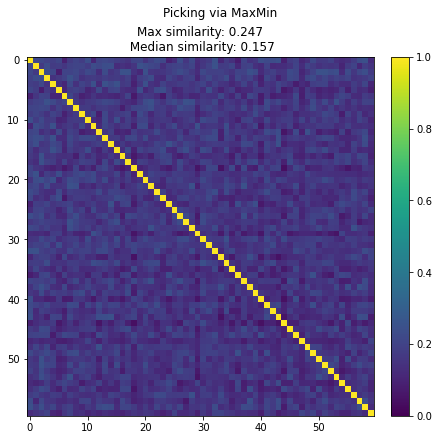

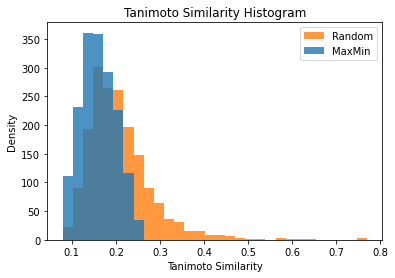

In [5]:
from rdkit.SimDivFilters import rdSimDivPickers
lp = rdSimDivPickers.LeaderPicker()

thresh = 0.75 # <- minimum distance between cluster centroids
picks = lp.LazyBitVectorPick(df['fps'].values, len(df), thresh, pickSize=60)
# print('Number of mols picked: {}'.format(len(picks)))

maxmin_mols = [df['mol'].values[x] for x in picks]
maxmin_fps = [df['fps'].values[x] for x in picks]

maxmin_mat = np.empty((len(maxmin_fps), len(maxmin_fps)))
for i in range(len(maxmin_fps)):
    maxmin_mat[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(maxmin_fps[i], maxmin_fps))

fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
fig.suptitle('Picking via MaxMin')
cax = ax.matshow(maxmin_mat, aspect="auto", vmin=0, vmax=1)
ax.set_title('Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(maxmin_mat[~np.eye(maxmin_mat.shape[0], dtype=bool)]),
    np.median(maxmin_mat[~np.eye(maxmin_mat.shape[0], dtype=bool)])))
ax.xaxis.set_ticks_position('bottom')
fig.colorbar(cax)
plt.show()

fig = plt.figure()
mask = np.tri(maxmin_mat.shape[0], k=-1)  # masks the lower triangle
maxmin_masked = np.ma.array(maxmin_mat, mask=mask)
plt.title('Tanimoto Similarity Histogram')
_, bins, _ = plt.hist(rand_mat[rand_masked.mask].flatten(),
         bins=30, label='Random', alpha=0.8, color=cmap(1))  # only choose the lower triangle
plt.hist(maxmin_mat[maxmin_masked.mask].flatten(),
         bins=bins, label='MaxMin', alpha=0.8, color=cmap(0))  # only choose the lower triangle
plt.legend(loc='upper right')

plt.xlabel('Tanimoto Similarity')
plt.ylabel('Density')
plt.show()

display(HTML("<h3>MaxMin</h3>"))
mols2grid.display(maxmin_mols, template="table",
                  n_rows=15, n_cols=4, subset=["img"], tooltip=['SMILES'], maxMols=60, size=(300, 150))


In [4]:

ward = HierarchicalClusterPicker(ClusterMethod.CLINK)
ids = ward.Pick(d_mat, len(df['mol'].values), 60)

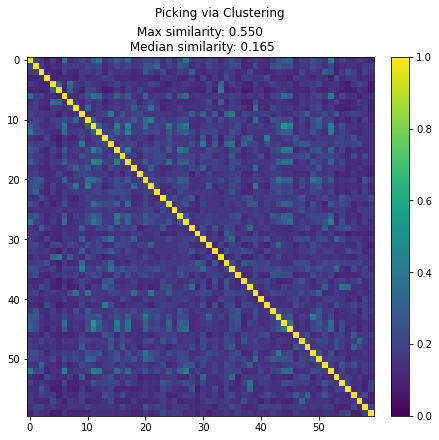

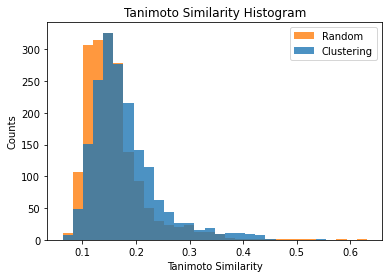

In [6]:
import mols2grid

ward_mols = [df['mol'].values[x] for x in ids]
ward_fps = [df['fps'].values[x] for x in ids]

ward_mat = np.empty((len(ward_fps), len(ward_fps)))
for i in range(len(ward_fps)):
    ward_mat[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(ward_fps[i], ward_fps))

fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
fig.suptitle('Picking via Clustering')
cax = ax.matshow(ward_mat, aspect="auto", vmin=0, vmax=1)
ax.set_title('Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(ward_mat[~np.eye(ward_mat.shape[0], dtype=bool)]),
    np.median(ward_mat[~np.eye(ward_mat.shape[0], dtype=bool)])))
ax.xaxis.set_ticks_position('bottom')
fig.colorbar(cax)

fig = plt.figure()
mask = np.tri(ward_mat.shape[0], k=-1)  # masks the lower triangle
ward_masked = np.ma.array(ward_mat, mask=mask)
plt.title('Clustering')
plt.title('Tanimoto Similarity Histogram')
_, bins, _ = plt.hist(rand_mat[rand_masked.mask].flatten(),
                      bins=30, label='Random', alpha=0.8, color=cmap(1))  # only choose the lower triangle
plt.hist(ward_mat[ward_masked.mask].flatten(),
         bins=bins, label='Clustering', alpha=0.8, color=cmap(0))  # only choose the lower triangle
plt.legend(loc='upper right')
plt.xlabel('Tanimoto Similarity')
plt.ylabel('Counts')
plt.show()

display(HTML("<h3>Clustering</h3>"))
mols2grid.display([df['mol'].values[x] for x in ids], template="table",
                  n_rows=15, n_cols=4, subset=["img"], tooltip=['SMILES'], maxMols=60, size=(300, 150))


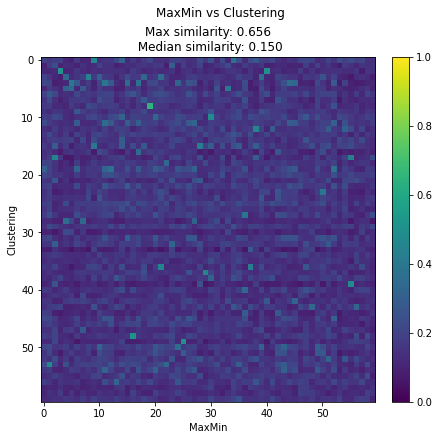

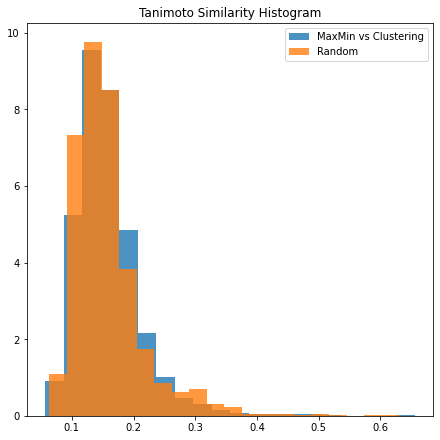

In [9]:
comp_mat = np.empty((len(maxmin_fps), len(ward_fps)))
for i in range(len(maxmin_fps)):
    comp_mat[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(maxmin_fps[i], ward_fps))

fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
fig.suptitle('MaxMin vs Clustering')
cax = ax.matshow(comp_mat, aspect="auto", vmin=0, vmax=1)
ax.set_title('Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(comp_mat),
    np.median(comp_mat)))

ax.set_xlabel('MaxMin')
ax.set_ylabel('Clustering')
ax.xaxis.set_ticks_position('bottom')
fig.colorbar(cax)

fig, ax = plt.subplots(figsize=(6, 6), constrained_layout=True)
ax.set_title('Tanimoto Similarity Histogram')
ax.hist(comp_mat.flatten(),
        bins=20, density=True, label='MaxMin vs Clustering', alpha=0.8)  # only choose the lower triangle

ax.hist(rand_mat[rand_masked.mask].flatten(),
            bins=20, density=True, label='Random', alpha=0.8)  # only choose the lower triangle
plt.legend(loc='upper right')
plt.show()

# top_n = len(comp_mat[comp_mat==1])

# max_inds = np.unravel_index(np.argpartition(
#     comp_mat.flatten(), -top_n)[-top_n:], shape=(comp_mat.shape))

# x = max_inds[0]
# y = max_inds[1]

# mols2grid.display([ward_mols[i] for i in y],
#                   size=(300, 150), subset=["img"], tooltip=['SMILES'], template='table')


In [13]:
data_dir = '/rds-d7/project/rds-ZNFRY9wKoeE/EnamineREAL/data/'

pd.DataFrame(smi, columns=['smiles']).to_csv(data_dir+'../topN/'+target+'_picks.csv', index=False)


NameError: name 'smi' is not defined

In [42]:
from collections import defaultdict
import numpy as np

def assignPointsToClusters(picks,fps):
    clusters = defaultdict(list)
    for i,idx in enumerate(picks):
        clusters[i].append(idx)
    sims = np.zeros((len(picks),len(fps)))
    for i in range(len(picks)):
        pick = picks[i]
        sims[i,:] = DataStructs.BulkTanimotoSimilarity(fps[pick],fps)
        sims[i,i] = 0
    best = np.argmax(sims,axis=0)
    for i,idx in enumerate(best):
        if i not in picks:
            clusters[idx].append(i)
    return clusters

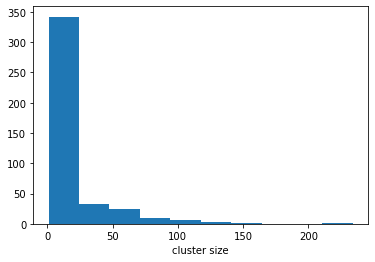

In [43]:
clusters = assignPointsToClusters(picks,fps)
hist([len(clusters[x]) for x in clusters]);
xlabel('cluster size');

In [44]:
clusts12 = [x for x in clusters if len(clusters[x])==16]
len(clusts12)

7

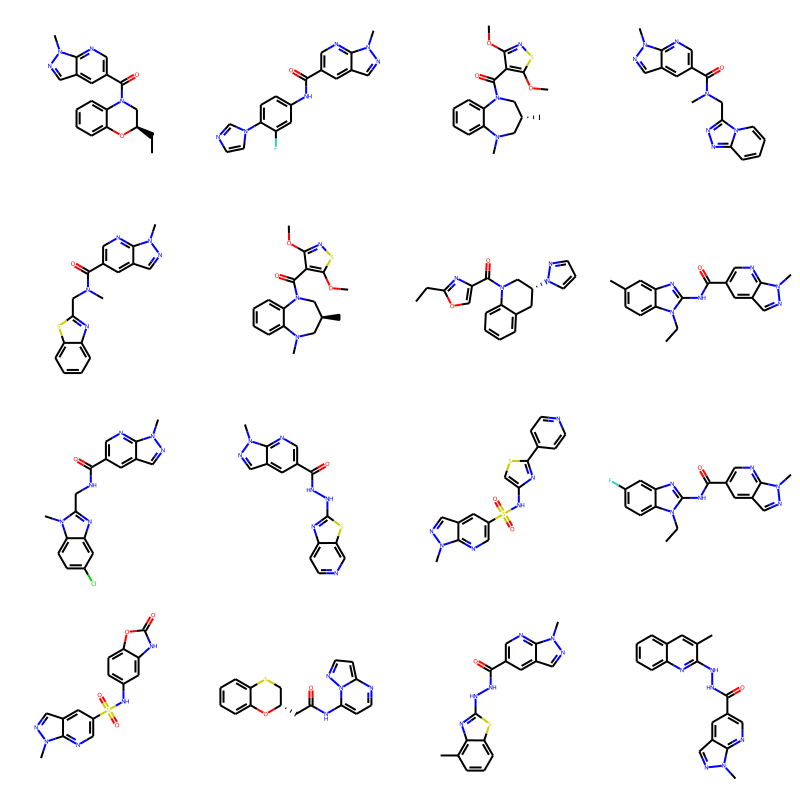

In [48]:
Draw.MolsToGridImage([ms[x] for x in clusters[clusts12[3]]],molsPerRow=4)


# Visualise Picks

In [46]:
def return_picks(target):
    data_dir = '/rds-d7/project/rds-ZNFRY9wKoeE/EnamineREAL/data/'

    df = pd.read_csv(data_dir+'../topN/topN_new_filtered_' + target+'.csv')
    print('No. of mols before alert filtering: {}'.format(len(df)))

    df['mol'] = [Chem.MolFromSmiles(smi) for smi in df["smiles"]]
    df["alerts"] = df['mol'].apply(search_alerts)

    df = df[~df["alerts"]].reset_index()
    print('No. of mols after alert filtering: {}'.format(len(df)))

    df['fps'] = [rdMolDescriptors.GetMorganFingerprintAsBitVect(
        m, 2, 2048) for m in df['mol']]

    lp = rdSimDivPickers.LeaderPicker()

    thresh = 0.75  # <- minimum distance between cluster centroids
    picks = lp.LazyBitVectorPick(df['fps'].values, len(df), thresh, pickSize=60)
    # print('Number of mols picked: {}'.format(len(picks)))

    picked_df = df.iloc[picks]

    return picked_df

mpro_picks = return_picks('mpro')
mac1_picks = return_picks('mac1')
dpp11_picks = return_picks('dpp11')

No. of mols before alert filtering: 30902
No. of mols after alert filtering: 25184
No. of mols before alert filtering: 50000
No. of mols after alert filtering: 46666
No. of mols before alert filtering: 50000
No. of mols after alert filtering: 43763


In [53]:
print(mpro_picks['fps'].values[1])

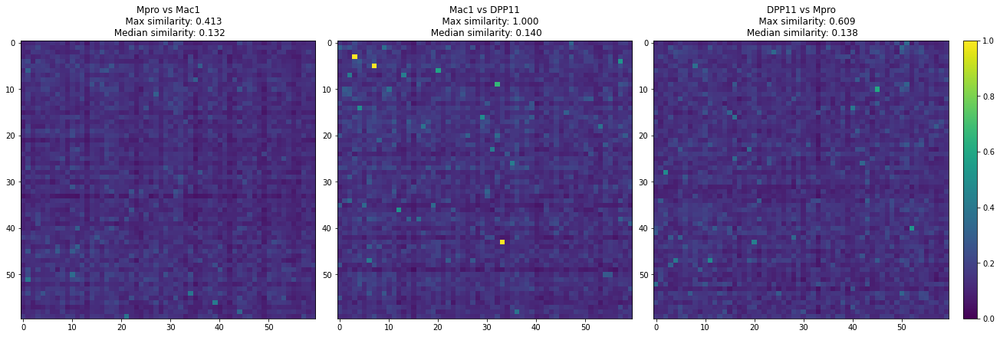

In [67]:
mpro_vs_mac1 = np.empty((len(mpro_picks['fps']), len(mac1_picks['fps'])))
for i in range(len(mpro_picks['fps'])):
    mpro_vs_mac1[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(mpro_picks['fps'].values[i], mac1_picks['fps'].values))

mac1_vs_dpp11 = np.empty((len(mac1_picks['fps']), len(dpp11_picks['fps'])))
for i in range(len(mac1_picks['fps'])):
    mac1_vs_dpp11[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(mac1_picks['fps'].values[i], dpp11_picks['fps'].values))

dpp11_vs_mpro = np.empty((len(dpp11_picks['fps']), len(mpro_picks['fps'])))
for i in range(len(dpp11_picks['fps'])):
    dpp11_vs_mpro[i] = np.array(
        DataStructs.BulkTanimotoSimilarity(dpp11_picks['fps'].values[i], mpro_picks['fps'].values))

fig, axs = plt.subplots(figsize=(18, 6), nrows=1, ncols=3, constrained_layout=True)
# fig.suptitle('Comparing picked molecules')
cax = axs[0].matshow(mpro_vs_mac1, aspect="auto", vmin=0, vmax=1)
axs[0].set_title('Mpro vs Mac1\n\
    Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(mpro_vs_mac1),
    np.median(mpro_vs_mac1)))
axs[0].xaxis.set_ticks_position('bottom')
# fig.colorbar(cax)

cax = axs[1].matshow(mac1_vs_dpp11, aspect="auto", vmin=0, vmax=1)
axs[1].set_title('Mac1 vs DPP11\n\
    Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(mac1_vs_dpp11),
    np.median(mac1_vs_dpp11)))
axs[1].xaxis.set_ticks_position('bottom')
# fig.colorbar(cax)

cax = axs[2].matshow(dpp11_vs_mpro, aspect="auto", vmin=0, vmax=1)
axs[2].set_title('DPP11 vs Mpro\n\
    Max similarity: {:.3f}\n Median similarity: {:.3f}'.format(
    np.amax(dpp11_vs_mpro),
    np.median(dpp11_vs_mpro)))
axs[2].xaxis.set_ticks_position('bottom')
fig.colorbar(cax)


In [92]:
top_n = 3

max_inds = np.unravel_index(np.argpartition(
    mac1_vs_dpp11.flatten(), -top_n)[-top_n:], shape=((len(mac1_picks['fps']), len(dpp11_picks['fps']))))

x = max_inds[0]
y = max_inds[1]

mols2grid.display([Chem.MolFromSmiles(x) for x in dpp11_picks['smiles'].iloc[y]],
                  size=(300, 150), subset=["img"], tooltip=['SMILES'], template='table')

# for n in range(top_n):
    
#     print(dpp11_picks.iloc[y[n]]['smiles'], mac1_picks.iloc[x[n]]['smiles'])
#     assert dpp11_picks.iloc[y[n]]['smiles'] == mac1_picks.iloc[x[n]]['smiles']
